# Fast AI

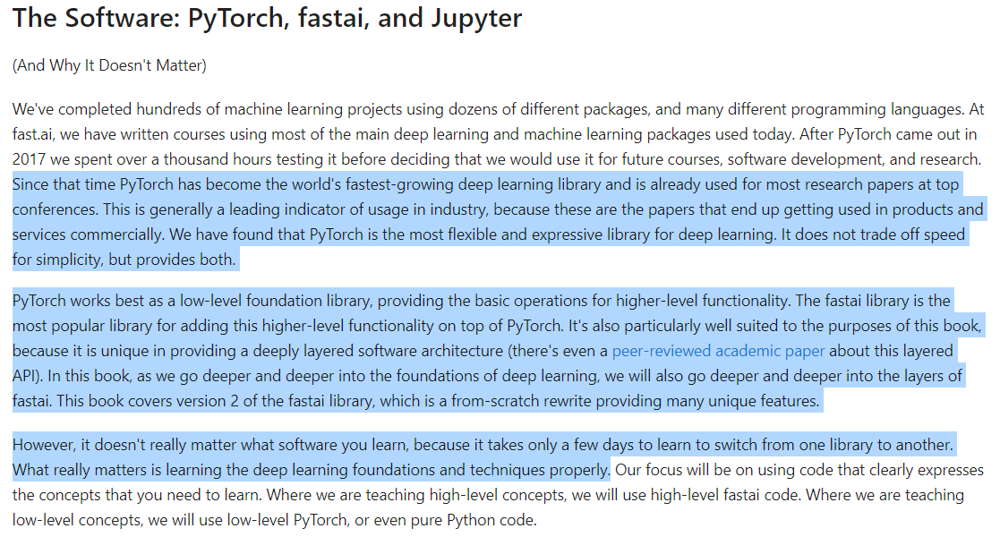

https://github.com/fastai/fastbook/blob/master/01_intro.ipynb

## **Core**

- `Learner`: The central object in FastAI for training models. It binds a model, a data loader, an optimizer, and a loss function.
- `DataLoaders`: A class for handling and transforming a dataset into a format that can be fed into a neural network.
- `DataBlock`: A flexible API for defining how to get, split, and label data, and how to transform it.

### DataLoaders
DataLoaders is a class that holds DataLoader objects for both the training and validation datasets. It's essentially a container for your training and validation data, providing the data in batches to the model during training.

Example:


#### ImageDataLoaders

In [ ]:
from fastai.vision.all import *

dls = ImageDataLoaders.from_folder(path, train='train', valid='valid', 
                                   item_tfms=Resize(224))

#Here, DataLoaders is created from images in a folder, with separate subfolders for training and validation data.



#Another example
dls = ImageDataLoaders.from_name_re(path, get_image_files(path/"images"), 
                                    pat=r'([^/]+)_\d+.jpg$', 
                                    item_tfms=Resize(224), 
                                    batch_tfms=aug_transforms())

# **ImageDataLoaders.from_name_re:**
# ImageDataLoaders is a class in FastAI that provides methods to easily create a DataLoaders object for image data.
# from_name_re is a method of ImageDataLoaders. It's used to create a DataLoaders object where the labels for the images are derived from the filenames using a regular expression (regex).

# path, get_image_files(path/"images"):
# path is the directory containing your image data.
# get_image_files is a function that gets the paths of all the image files in a given directory. Here, it's used to get the paths of images in the images subdirectory of path.

# pat=r'([^/]+)_\d+.jpg$':
# This is the regular expression pattern used to extract labels from the filenames.
# The pattern r'([^/]+)_\d+.jpg$' means:
# ([^/]+): Match and capture a group of one or more characters that are not a forward slash (/). This part is typically used to capture the label from the filename.
# _\d+: Match an underscore followed by one or more digits. This part usually represents some form of numbering in the filenames and is not part of the label.
# .jpg: Match the file extension. This indicates that the function should only consider files ending in .jpg.

# item_tfms=Resize(224):
# item_tfms stands for item transforms. These are transformations applied to each individual item (in this case, each image) in the dataset.
# Resize(224) is a transformation that resizes each image to 224x224 pixels. This is a common image size for models like ResNet.

# batch_tfms=aug_transforms():
# batch_tfms stands for batch transforms. These are transformations applied to a batch of items.
# aug_transforms() is a function that provides a set of default augmentations (like rotation, zooming, etc.) that are suitable for a wide range of tasks. This helps 
# in making the model more robust by training it on slightly varied versions of the training images.

#### TextDataLoaders 

In [ ]:
dls = TextDataLoaders.from_folder(untar_data(URLs.IMDB), valid='test')

#### TabularDataLoaders

In [ ]:
path = untar_data(URLs.ADULT_SAMPLE)
dls = TabularDataLoaders.from_csv(path/'adult.csv', path=path, y_names="salary",
                                  cat_names = ['workclass', 'education', 'marital-status', 'occupation',
                                               'relationship', 'race'],
                                  cont_names = ['age', 'fnlwgt', 'education-num'],
                                  procs = [Categorify, FillMissing, Normalize])


# Categorify:
# This transformation converts categorical variables into category types. In Pandas, this is akin to changing columns with string types into categorical types.
# It's essential for machine learning models since they require numerical input. Categorify will internally map each unique category to an index, making it easier for models to work with categorical data.

# FillMissing:
# This transformation deals with missing values in the data. It replaces missing values with the median of the column and creates a new boolean column indicating whether the data was missing.
# For example, if a column age has missing values, FillMissing will create a new column age_na that has True where age was missing and False otherwise. This helps the model learn from the pattern of missing data, which can be informative.

# Normalize:
# This transformation scales continuous variables to have a mean of 0 and a standard deviation of 1. This process is known as normalization or standardization.
# Normalizing data is a common practice in machine learning, as it can lead to faster convergence during training and prevent the model from being biased towards variables with larger scales.


### Learner
The Learner is a central object in FastAI that binds together a model, a DataLoader (which contains your dataset), an optimizer, and a loss function. It is used to train the model.

Example:


In [ ]:
from fastai.vision.all import *

path = untar_data(URLs.PETS)
files = get_image_files(path/"images")

def label_func(f): return f[0].isupper()

dls = ImageDataLoaders.from_name_func(
    path, files, label_func, item_tfms=Resize(224)
)

learn = cnn_learner(dls, resnet34, metrics=error_rate)
learn.fine_tune(1)


#A Learner for image classification is created using the cnn_learner function, which automatically creates a CNN suitable for your data.

### DataBlock
DataBlock is a highly flexible API that allows you to define the steps needed to gather your data, split it, label it, and apply transformations. It's a more customizable way of creating a DataLoaders.

Example:

In [ ]:
pets = DataBlock(blocks=(ImageBlock, CategoryBlock),
                 get_items=get_image_files,
                 splitter=RandomSplitter(seed=42),
                 get_y=using_attr(RegexLabeller(r'(.+)_\d+.jpg$'), 'name'),
                 item_tfms=Resize(224),
                 batch_tfms=aug_transforms())

dls = pets.dataloaders(path/"images")

# Aa DataBlock for a pet classification task is defined, where images are categorized based on the pet's name extracted from the file name using a regular expression.

## Utilities

#### `show_results`

show_results is used to display the results of a model's predictions, typically showing a few examples from the validation set along with the actual and predicted labels.

Example:


In [ ]:
from fastai.vision.all import *

path = untar_data(URLs.PETS)
dls = ImageDataLoaders.from_name_re(path, get_image_files(path/"images"), 
                                    pat=r'([^/]+)_\d+.jpg$', 
                                    item_tfms=Resize(224))

learn = cnn_learner(dls, resnet34, metrics=error_rate)
learn.fine_tune(1)
learn.show_results()

#In this example, after training a CNN on the Pets dataset, show_results is used to display images, their true labels, and the model's predictions.

#### `save and load`
save and load are used to save a model's weights to disk and load them back, respectively.

Example:

In [ ]:
learn.save('my_model')
# ... load
learn.load('my_model')

#Here, learn.save('my_model') saves the model's current state, and learn.load('my_model') can be used to reload the saved weights.

#### `lr_find`
lr_find helps to find an optimal learning rate for training. It increases the learning rate from a very small value and plots the loss, helping you to choose a good learning rate.

In [ ]:
learn.lr_find()
#After running this, you would typically see a plot of the learning rate against the loss, helping you to pick a learning rate where the loss is decreasing.

#### `fit_one_cycle`
fit_one_cycle is a training method that uses the "1cycle" learning rate policy. It starts with a low learning rate, increases it for the first half of training, and then decreases it for the second half.

Example:

In [ ]:
learn.fit_one_cycle(4, lr_max=1e-3)

#This trains the model for 4 epochs, starting with a learning rate of 1e-3 and adjusting it according to the 1cycle policy.

#### `Callbacks`
FastAI provides a range of callbacks for customizing the training loop, such as EarlyStoppingCallback, SaveModelCallback, etc.

In [ ]:
from fastai.callback.tracker import EarlyStoppingCallback, SaveModelCallback

learn = cnn_learner(dls, resnet34, metrics=error_rate, 
                    cbs=[EarlyStoppingCallback(monitor='error_rate', min_delta=0.01, patience=3),
                         SaveModelCallback(monitor='error_rate', fname='best_model')])

learn.fit_one_cycle(10, lr_max=1e-3)

#In this example, EarlyStoppingCallback stops training if the error rate doesn't improve by at least 0.01 for 3 epochs, and SaveModelCallback saves the best model based on the error rate.

## Vision

#### `unet_learner`
unet_learner is used for segmentation tasks, where the goal is to classify each pixel in the image.

In [ ]:
learn = unet_learner(dls, resnet34)
learn.fine_tune(6)

#### `image_classifier_learner`
image_classifier_learner is another method for creating a learner for image classification, similar to cnn_learner, but with more customization options.

In [ ]:
learn = image_classifier_learner(dls, resnet18, metrics=accuracy)
learn.fine_tune(2)

####  `aug_transforms`
aug_transforms provides a set of default data augmentations that are commonly used in training image models.

In [ ]:
dls = ImageDataLoaders.from_name_re(path, get_image_files(path/"images"), 
                                    pat=r'([^/]+)_\d+.jpg$', 
                                    item_tfms=Resize(224),
                                    batch_tfms=aug_transforms())
#In this example, aug_transforms is used to apply standard augmentations.

## Let's do something pratical

In [4]:
from fastai.vision.all import *

This tutorial highlights on how to quickly build a Learner and fine tune a pretrained model on most computer vision tasks.

### Single-label classification
For this task, we will use the Oxford-IIIT Pet Dataset that contains images of cats and dogs of 37 different breeds. We will first show how to build a simple cat-vs-dog classifier, then a little bit more advanced model that can classify all breeds.

The dataset can be downloaded and decompressed with this line of code:

In [5]:
path = untar_data(URLs.PETS)

#untar_data is a function provided by the FastAI library, primarily used in the context of downloading and extracting datasets. 
# This function is particularly useful because it simplifies the process of obtaining standard datasets for training and testing machine learning models, 
# especially in educational or experimental settings.

It will only do this download once, and return the location of the decompressed archive. We can check what is inside with the .ls() method.

In [6]:
path.ls()

(#2) [Path('C:/Users/u0161169/.fastai/data/oxford-iiit-pet/annotations'),Path('C:/Users/u0161169/.fastai/data/oxford-iiit-pet/images')]

(#3) [Path('/home/jhoward/.fastai/data/oxford-iiit-pet/annotations'),Path('/home/jhoward/.fastai/data/oxford-iiit-pet/images'),Path('/home/jhoward/.fastai/data/oxford-iiit-pet/models')]

We will ignore the annotations folder for now, and focus on the images one. get_image_files is a fastai function that helps us grab all the image files (recursively) in one folder.

In [7]:
files = get_image_files(path/"images")

In [8]:
len(files)

7390

### Cats vs dogs

To label our data for the cats vs dogs problem, we need to know which filenames are of dog pictures and which ones are of cat pictures. There is an easy way to distinguish: the name of the file begins with a capital for cats, and a lowercased letter for dogs:

In [9]:
files[0],files[6]

(Path('C:/Users/u0161169/.fastai/data/oxford-iiit-pet/images/Abyssinian_1.jpg'),
 Path('C:/Users/u0161169/.fastai/data/oxford-iiit-pet/images/Abyssinian_104.jpg'))

We can then define an easy label function:

In [10]:
def label_func(f): return f[0].isupper()

To get our data ready for a model, we need to put it in a DataLoaders object. Here we have a function that labels using the file names, so we will use ImageDataLoaders.from_name_func. There are other factory methods of ImageDataLoaders that could be more suitable for your problem, so make sure to check them all in vision.data.

In [11]:
dls = ImageDataLoaders.from_name_func(path, files, label_func, item_tfms=Resize(224))

We have passed to this function the directory we're working in, the files we grabbed, our label_func and one last piece as item_tfms: this is a Transform applied on all items of our dataset that will resize each image to 224 by 224, by using a random crop on the largest dimension to make it a square, then resizing to 224 by 224. If we didn't pass this, we would get an error later as it would be impossible to batch the items together.

We can then check if everything looks okay with the show_batch method (True is for cat, False is for dog):

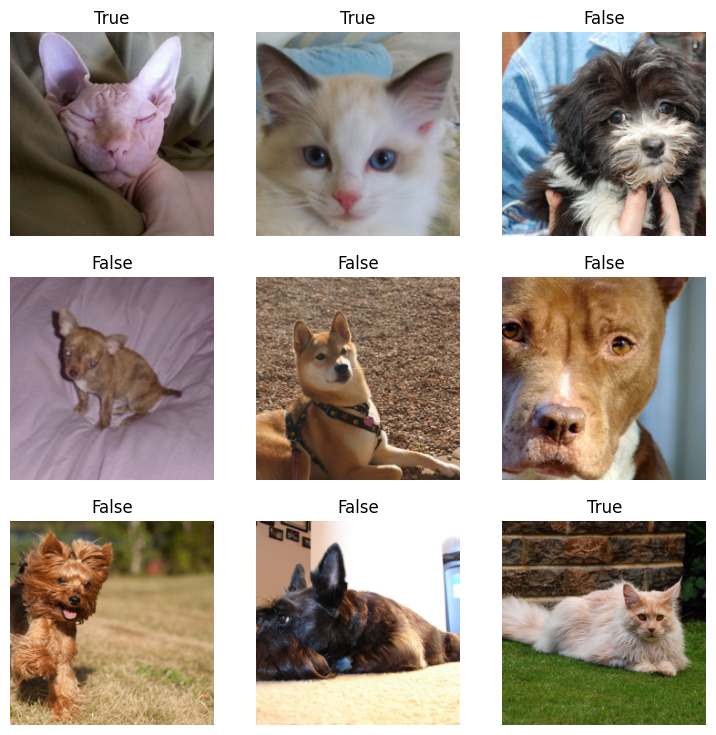

In [12]:
dls.show_batch()

Then we can create a Learner, which is a fastai object that combines the data and a model for training, and uses transfer learning to fine tune a pretrained model in just two lines of code:

In [13]:
learn = cnn_learner(dls, resnet34, metrics=error_rate)
learn.fine_tune(1)
# this will take 20-25minutes on a CPU (-> try to do it in Google Colab)
# 3 min in a GPU 12Gb

c:\Users\u0161169\AppData\Local\miniconda3\envs\env_pytorch\lib\site-packages\fastai\vision\learner.py:301: UserWarning: `cnn_learner` has been renamed to `vision_learner` -- please update your code
  warn("`cnn_learner` has been renamed to `vision_learner` -- please update your code")
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to C:\Users\u0161169/.cache\torch\hub\checkpoints\resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:09<00:00, 9.29MB/s]


The first line downloaded a model called ResNet34, pretrained on ImageNet, and adapted it to our specific problem. It then fine tuned that model and in a relatively short time, we get a model with an error rate of 0.3%... amazing!

If you want to make a prediction on a new image, you can use learn.predict:

In [14]:
learn.predict(files[0])

('True', tensor(1), tensor([5.5036e-08, 1.0000e+00]))

The predict method returns three things: the decoded prediction (here False for dog), the index of the predicted class and the tensor of probabilities of all classes in the order of their indexed labels(in this case, the model is quite confifent about the being that of a dog). This method accepts a filename, a PIL image or a tensor directly in this case. We can also have a look at some predictions with the show_results method:

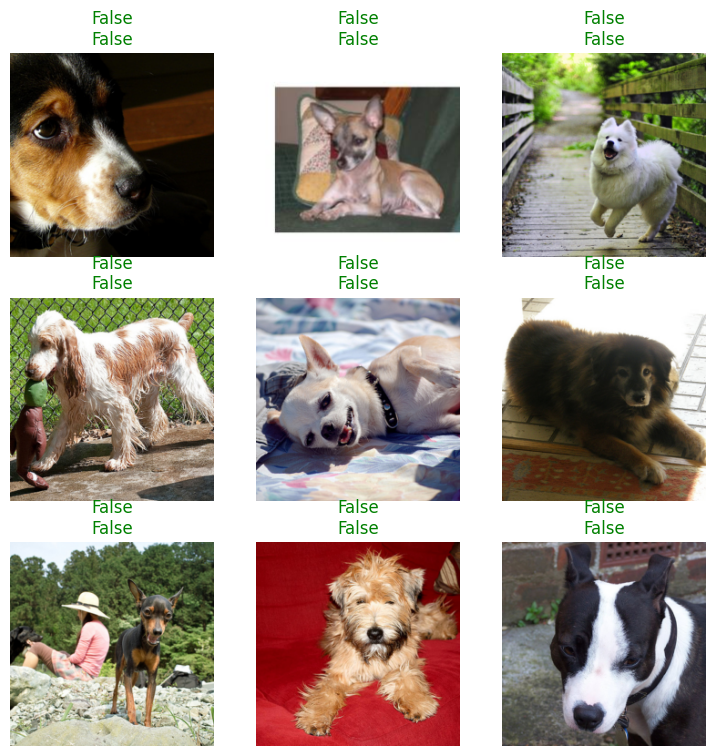

In [15]:
learn.show_results()

Check out the other applications like text or tabular, or the other problems covered in this tutorial, and you will see they all share a consistent API for gathering the data and look at it, create a Learner, train the model and look at some predictions.

### Classifying breeds
To label our data with the breed name, we will use a regular expression to extract it from the filename. Looking back at a filename, we have:

In [16]:
files[0].name

'Abyssinian_1.jpg'

In [17]:
'great_pyrenees_173.jpg'

'great_pyrenees_173.jpg'

so the class is everything before the last _ followed by some digits. A regular expression that will catch the name is thus:

In [18]:
pat = r'^(.*)_\d+.jpg'

Since it's pretty common to use regular expressions to label the data (often, labels are hidden in the file names), there is a factory method to do just that:

In [19]:
dls = ImageDataLoaders.from_name_re(path, files, pat, item_tfms=Resize(224))

Like before, we can then use show_batch to have a look at our data:

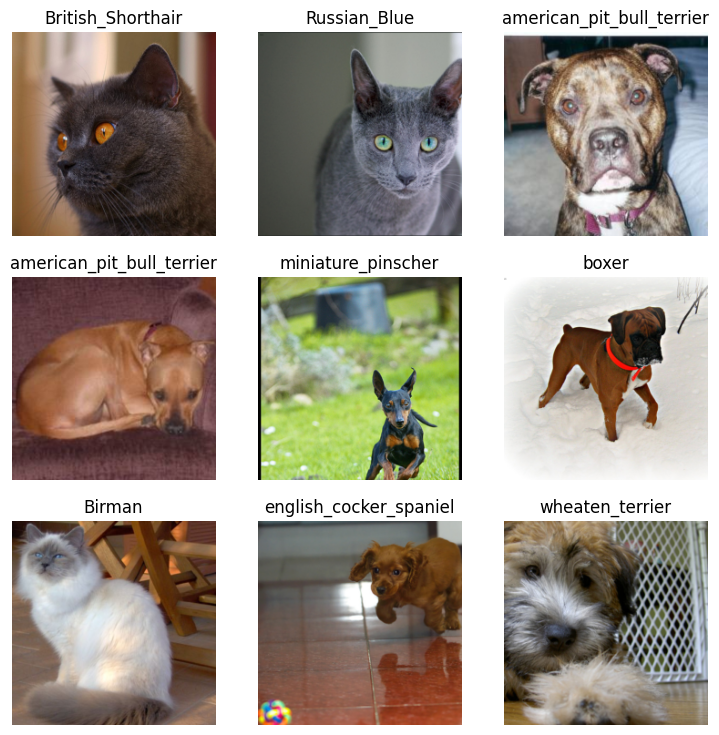

In [20]:
dls.show_batch()

Since classifying the exact breed of cats or dogs amongst 37 different breeds is a harder problem, we will slightly change the definition of our DataLoaders to use data augmentation:

In [21]:
dls = ImageDataLoaders.from_name_re(path, files, pat, item_tfms=Resize(460),
                                    batch_tfms=aug_transforms(size=224))

This time we resized to a larger size before batching, and we added batch_tfms. aug_transforms is a function that provides a collection of data augmentation transforms with defaults we found that perform well on many datasets. You can customize these transforms by passing appropriate arguments to aug_transnforms.

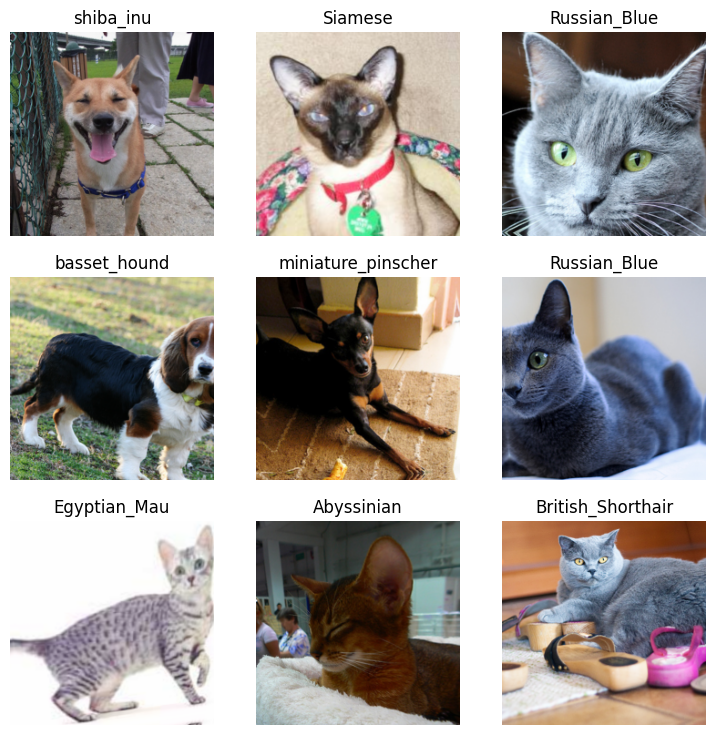

In [22]:
dls.show_batch()

We can then create our Learner exactly as before and train our model.

In [23]:
learn = cnn_learner(dls, resnet34, metrics=error_rate)

We used the default learning rate before, but we might want to find the best one possible. For this, we can use the learning rate finder:

SuggestedLRs(valley=0.0008317637839354575)

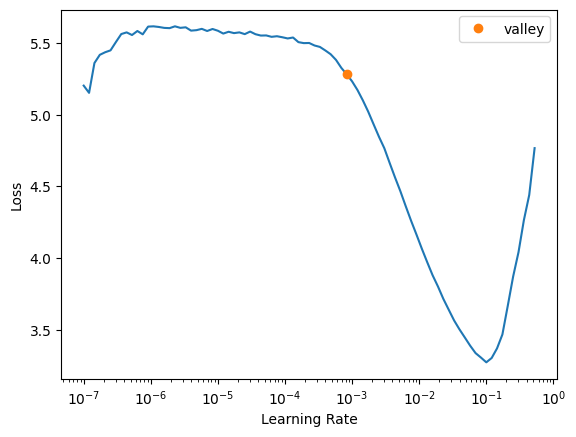

In [24]:
learn.lr_find()
# Also this one will take quite a while to calculate on a CPU (approximately 15-20 minutes)

SuggestedLRs(lr_min=0.010000000149011612, lr_steep=0.0063095735386013985)

It plots the graph of the learning rate finder and gives us two suggestions (minimum divided by 10 and steepest gradient). Let's use 3e-3 here. We will also do a bit more epochs:

In [25]:
learn.fine_tune(2, 3e-3)
# this will also take +/-50 minutes on CPU only
# 3 min GPU 12Gb

Again, we can have a look at some predictions with show_results:

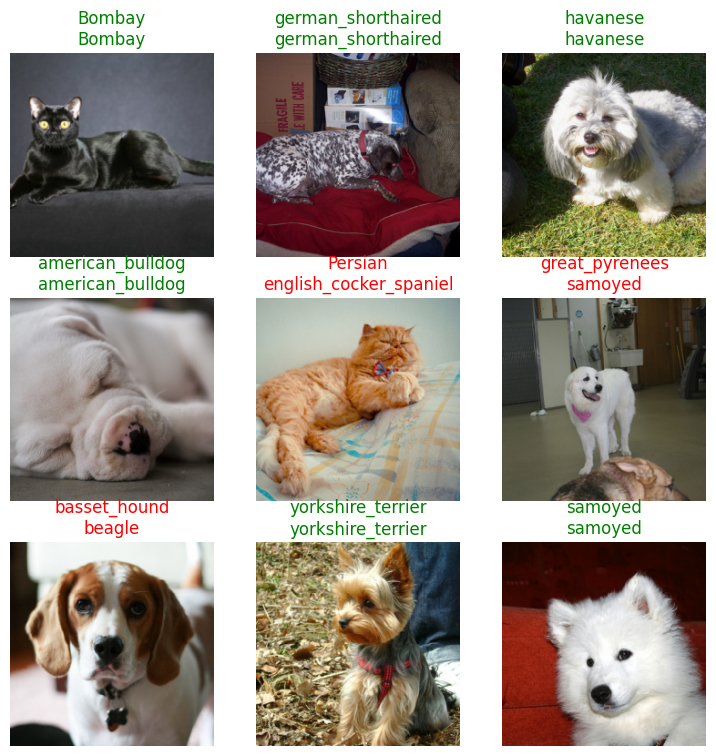

In [26]:
learn.show_results()

Another thing that is useful is an interpretation object, it can show us where the model made the worse predictions:

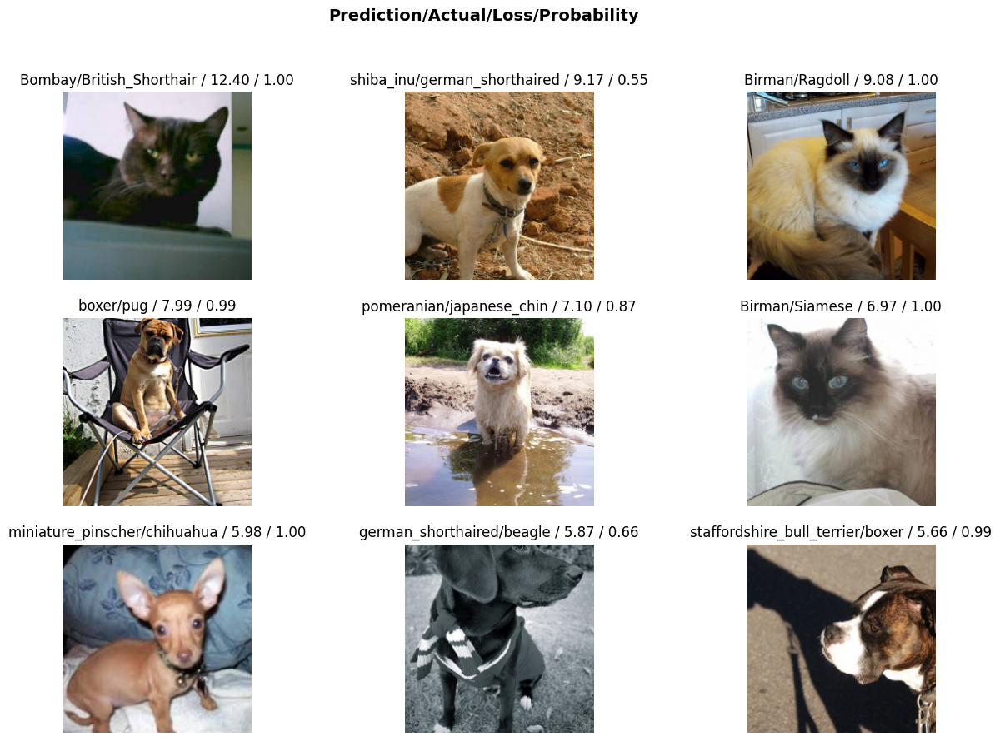

In [27]:
interp = Interpretation.from_learner(learn)
interp.plot_top_losses(9, figsize=(15,10))

### Single-label classification - With the data block API
We can also use the data block API to get our data in a DataLoaders. This is a bit more advanced, so feel free to skip this part if you are not comfortable with learning new API's just yet.

A datablock is built by giving the fastai library a bunch of informations:

* the types used, through an argument called blocks: here we have images and categories, so we pass ImageBlock and CategoryBlock.
* how to get the raw items, here our function get_image_files.
* how to label those items, here with the same regular expression as before.
* how to split those items, here with a random splitter.
* the item_tfms and batch_tfms like before.

In [28]:
pets = DataBlock(blocks=(ImageBlock, CategoryBlock), 
                 get_items=get_image_files, 
                 splitter=RandomSplitter(),
                 get_y=using_attr(RegexLabeller(r'(.+)_\d+.jpg$'), 'name'),
                 item_tfms=Resize(460),
                 batch_tfms=aug_transforms(size=224))

The pets object by itself is empty: it only containes the functions that will help us gather the data. We have to call dataloaders method to get a DataLoaders. We pass it the source of the data:

In [29]:
dls = pets.dataloaders(untar_data(URLs.PETS)/"images")

Then we can look at some of our pictures with dls.show_batch()

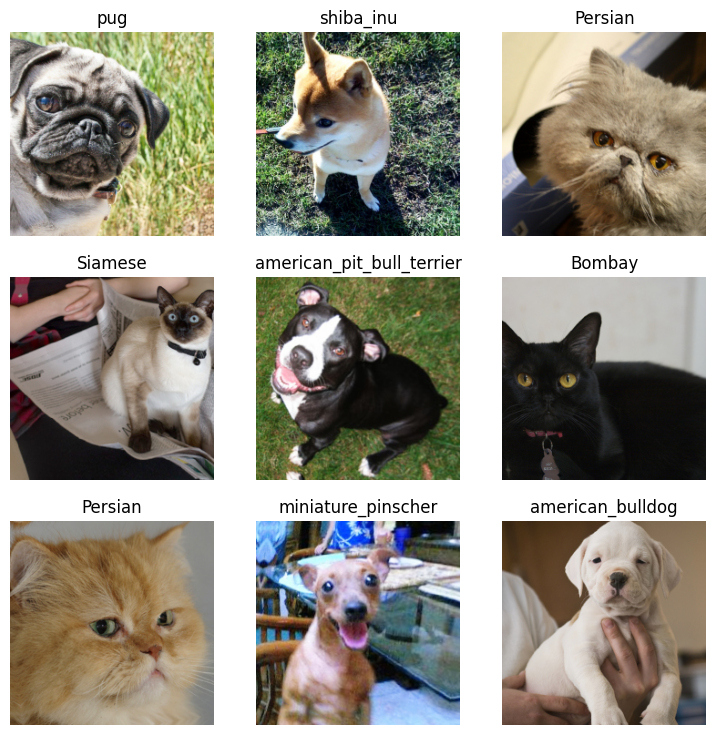

In [30]:
dls.show_batch(max_n=9)

### Multi-label classification
For this task, we will use the Pascal Dataset that contains images with different kinds of objects/persons. It's orginally a dataset for object detection, meaning the task is not only to detect if there is an instance of one class of an image, but to also draw a bounding box around it. Here we will just try to predict all the classes in one given image.

Multi-label classification defers from before in the sense each image does not belong to one category. An image could have a person and a horse inside it for instance. Or have none of the categories we study.

As before, we can download the dataset pretty easily:

In [ ]:
path = untar_data(URLs.PASCAL_2007)
path.ls()
# Will also take quite some time (60+ minutes, depending on the connection speed)

The information about the labels of each image is in the file named train.csv. We load it using pandas:

In [ ]:
df = pd.read_csv(path/'train.csv')
df.head()

,fname,labels,is_valid
0,000005.jpg,chair,True
1,000007.jpg,car,True
2,000009.jpg,horse person,True
3,000012.jpg,car,False
4,000016.jpg,bicycle,True


### Multi-label classification - Using the high-level API
That's pretty straightforward: for each filename, we get the different labels (separated by space) and the last column tells if it's in the validation set or not. To get this in DataLoaders quickly, we have a factory method, from_df. We can specify the underlying path where all the images are, an additional folder to add between the base path and the filenames (here train), the valid_col to consider for the validation set (if we don't specify this, we take a random subset), a label_delim to split the labels and, as before, item_tfms and batch_tfms.

Note that we don't have to specify the fn_col and the label_col because they default to the first and second column respectively.

In [ ]:
dls = ImageDataLoaders.from_df(df, path, folder='train', valid_col='is_valid', label_delim=' ',
                               item_tfms=Resize(460), batch_tfms=aug_transforms(size=224))

Due to IPython and Windows limitation, python multiprocessing isn't available now.
So `number_workers` is changed to 0 to avoid getting stuck


As before, we can then have a look at the data with the show_batch method.

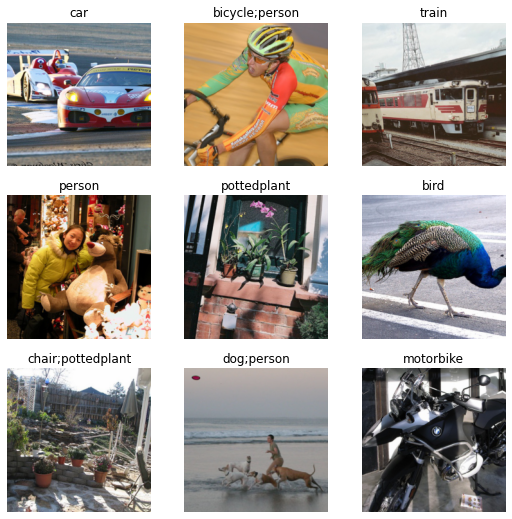

In [ ]:
dls.show_batch()

Training a model is as easy as before: the same functions can be applied and the fastai library will automatically detect that we are in a multi-label problem, thus picking the right loss function. The only difference is in the metric we pass: error_rate will not work for a multi-label problem, but we can use accuracy_thresh.

In [ ]:
learn = cnn_learner(dls, resnet50, metrics=partial(accuracy_multi, thresh=0.5))
# Less than 1 minute

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to C:\Users\u0131108/.cache\torch\hub\checkpoints\resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

As before, we can use learn.lr_find to pick a good learning rate:

SuggestedLRs(valley=0.0014454397605732083)

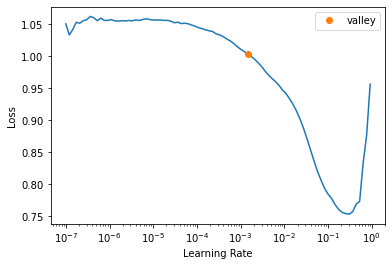

In [ ]:
learn.lr_find()
# this will also take +/- 45 minutes on CPU only

SuggestedLRs(lr_min=0.025118863582611083, lr_steep=0.03981071710586548)

We can pick the suggested learning rate and fine-tune our pretrained model:

In [ ]:
learn.fine_tune(2, 3e-2)
# this will also take 80+ minutes on CPU only

epoch,train_loss,valid_loss,accuracy_multi,time
0,0.431859,0.122699,0.958745,24:20


epoch,train_loss,valid_loss,accuracy_multi,time
0,0.187539,2.478910,0.927550,28:14
1,0.172826,0.132482,0.953865,28:17


epoch	train_loss	valid_loss	accuracy_multi	time
0	0.437855	0.136942	0.954801	00:17
epoch	train_loss	valid_loss	accuracy_multi	time
0	0.156202	0.465557	0.914801	00:20
1	0.179814	0.382907	0.930040	00:20
2	0.157007	0.129412	0.953924	00:20
3	0.125787	0.109033	0.960856	00:19

Like before, we can easily have a look at the results:

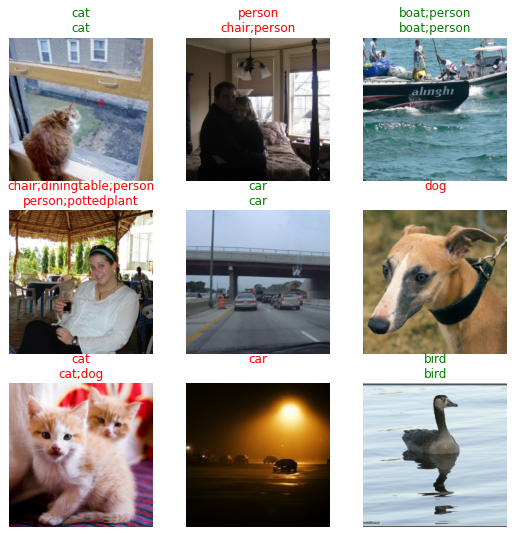

In [ ]:
learn.show_results()

Or get the predictions on a given image:

In [ ]:
learn.predict(path/'train/000005.jpg')

((#2) ['chair','diningtable'],
 tensor([False, False, False, False, False, False, False, False,  True, False,
          True, False, False, False, False, False, False, False, False, False]),
 tensor([1.2216e-03, 2.0452e-03, 5.8142e-04, 9.2374e-04, 1.0065e-01, 4.1240e-04,
         2.5078e-03, 1.2750e-02, 9.2776e-01, 2.6553e-03, 6.6367e-01, 1.0034e-02,
         4.9578e-04, 1.0411e-03, 1.3116e-01, 1.8842e-01, 1.0909e-03, 3.1793e-01,
         4.1480e-03, 4.4276e-01]))

As for the single classification predictions, we get three things. The last one is the prediction of the model on each class (going from 0 to 1). The second to last cooresponds to a one-hot encoded targets (you get True for all predicted classes, the ones that get a probability > 0.5) and the first is the decoded, readable version.

And like before, we can check where the model did its worse:

,target,predicted,probabilities,loss
0,bus;person,person,"TensorBase([[8.6779e-13, 3.1328e-11, 1.5513e-06, 4.6675e-04, 4.7649e-02, 4.2998e-14,\n 1.8121e-06, 9.9864e-03, 3.1986e-04, 1.3361e-12, 1.4550e-05, 9.2497e-03,\n 1.1015e-04, 2.2588e-08, 9.9987e-01, 1.2476e-03, 4.4151e-08, 7.0116e-03,\n 6.7415e-07, 8.8639e-07],\n [1.7875e-35, 2.4485e-29, 2.9090e-20, 2.5280e-07, 2.0084e-04, 0.0000e+00,\n 1.7487e-19, 9.9980e-01, 1.9604e-08, 2.3415e-34, 7.4280e-12, 9.5691e-01,\n 1.4853e-10, 2.9884e-21, 9.9184e-01, 2.1312e-10, 1.0413e-16, 7.3266e-08,\n 2.3679e-16, 8.0674e-22],\n [3.6287e-08, 5.1915e-07, 7.1899e-05, 1.3951e-02, 4.3027e-02, 7.7428e-08,\n 1.2511e-03, 8.6593e-03, 4.3332e-03, 3.0882e-08, 3.1342e-04, 1.7113e-02,\n 3.5937e-03, 1.9485e-05, 9.9945e-01, 2.3314e-02, 6.6278e-06, 3.0949e-02,\n 3.0262e-04, 2.3144e-04],\n [5.7481e-15, 1.3119e-10, 6.1218e-11, 8.2962e-04, 3.3367e-03, 1.5585e-16,\n 5.6752e-09, 9.9936e-01, 2.2344e-03, 4.4250e-14, 5.1998e-06, 8.6297e-01,\n 3.2219e-06, 1.6115e-08, 4.2203e-02, 2.0783e-05, 4.1059e-08, 1.0628e-04,\n 8.2283e-08, 5.5024e-11],\n [8.2407e-08, 9.7866e-07, 9.7211e-04, 9.1544e-04, 8.2561e-02, 1.5233e-08,\n 3.6335e-04, 8.1438e-03, 2.7247e-03, 1.2587e-07, 3.6451e-04, 1.2730e-03,\n 1.3457e-03, 1.3921e-05, 9.9782e-01, 2.3919e-02, 5.0107e-06, 2.6802e-02,\n 4.2373e-05, 1.9336e-04],\n [2.6447e-07, 2.2385e-06, 5.8288e-04, 2.3252e-03, 1.2122e-01, 1.0466e-07,\n 1.1006e-03, 3.5226e-03, 5.4751e-03, 1.7272e-07, 5.3790e-04, 1.9017e-03,\n 9.5863e-04, 2.9133e-05, 9.9984e-01, 2.3934e-02, 5.6056e-06, 7.3932e-02,\n 9.0204e-05, 8.3664e-04],\n [1.5127e-09, 1.1808e-07, 7.7870e-06, 4.8028e-04, 1.2004e-02, 2.8476e-11,\n 2.3695e-06, 9.7252e-01, 3.7930e-03, 3.8780e-09, 8.7860e-05, 2.5426e-01,\n 4.9257e-04, 4.4512e-06, 3.5220e-02, 2.3398e-04, 1.0610e-05, 1.1579e-03,\n 2.4375e-05, 1.2969e-07],\n [1.1419e-06, 6.8400e-07, 5.9068e-05, 1.1228e-01, 5.6622e-05, 3.3570e-05,\n 9.9996e-01, 1.8285e-08, 8.5151e-08, 6.0979e-09, 4.0362e-07, 1.1294e-05,\n 2.9103e-08, 2.5572e-06, 5.2252e-01, 7.6271e-05, 2.5738e-06, 3.3770e-07,\n 9.6559e-09, 1.2472e-06],\n [2.7147e-07, 7.2520e-08, 1.9706e-05, 8.9069e-02, 1.6417e-04, 3.1550e-06,\n 9.9939e-01, 3.0373e-07, 2.5482e-07, 7.9918e-10, 1.0576e-06, 5.7615e-05,\n 5.9153e-08, 1.3702e-07, 1.9442e-01, 6.3025e-05, 9.8673e-07, 1.3626e-06,\n 5.9299e-08, 2.6012e-06]])",1.542754888534546


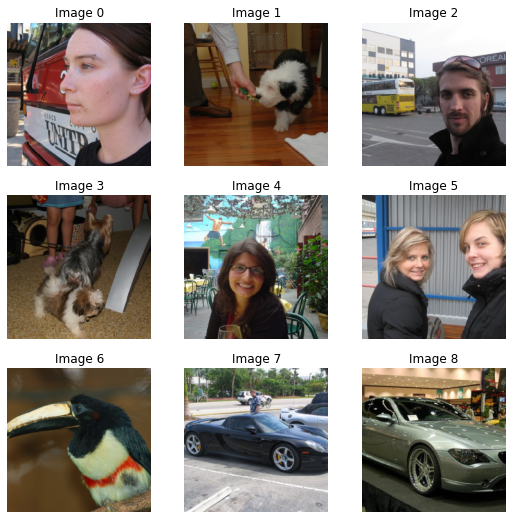

In [ ]:
interp = Interpretation.from_learner(learn)
interp.plot_top_losses(9)
# This will take +/- 5 minutes

### Multi-label classification - With the data block API
We can also use the data block API to get our data in a DataLoaders. Like we said before, feel free to skip this part if you are not comfortable with learning new APIs just yet.

Remember how the data is structured in our dataframe:

In [ ]:
df.head()

,fname,labels,is_valid
0,000005.jpg,chair,True
1,000007.jpg,car,True
2,000009.jpg,horse person,True
3,000012.jpg,car,False
4,000016.jpg,bicycle,True


fname	labels	is_valid
0	000005.jpg	chair	True
1	000007.jpg	car	True
2	000009.jpg	horse person	True
3	000012.jpg	car	False
4	000016.jpg	bicycle	True

In this case we build the data block by providing:

* the types used: ImageBlock and MultiCategoryBlock.
* how to get the input items from our dataframe: here we read the column fname and need to add path/train/ at the beginning to get proper filenames.
* how to get the targets from our dataframe: here we read the column labels and need to split by space.
* how to split the items, here by using the column is_valid.
* the item_tfms and batch_tfms like before.

In [ ]:
pascal = DataBlock(blocks=(ImageBlock, MultiCategoryBlock),
                   splitter=ColSplitter('is_valid'),
                   get_x=ColReader('fname', pref=str(path/'train') + os.path.sep),
                   get_y=ColReader('labels', label_delim=' '),
                   item_tfms = Resize(460),
                   batch_tfms=aug_transforms(size=224))

This block is slightly different than before: we don't need to pass a function to gather all our items as the dataframe we will give already has them all. However, we do need to preprocess the row of that dataframe to get our inputs, which is why we pass a get_x. It defaults to the fastai function noop, which is why we didn't need to pass it along before.

Like before, pascal is just a blueprint. We need to pass it the source of our data to be able to get DataLoaders:

In [ ]:
dls = pascal.dataloaders(df)

Due to IPython and Windows limitation, python multiprocessing isn't available now.
So `number_workers` is changed to 0 to avoid getting stuck


Then we can look at some of our pictures with dls.show_batch()

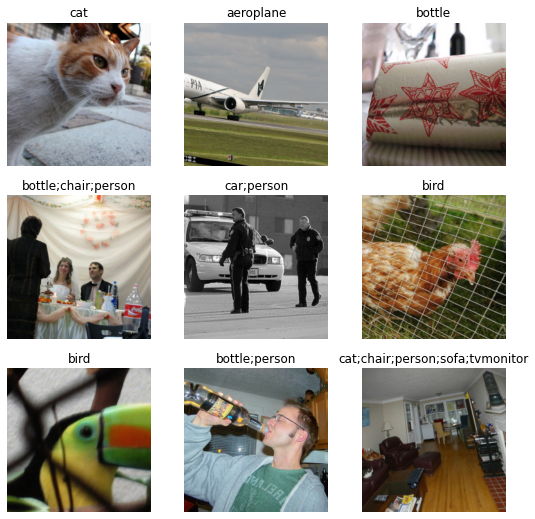

In [ ]:
dls.show_batch(max_n=9)

## Segmentation
Segmentation is a problem where we have to predict a category for each pixel of the image. For this task, we will use the Camvid dataset, a dataset of screenshots from cameras in cars. Each pixel of the image has a label such as "road", "car" or "pedestrian".

As usual, we can download the data with our untar_data function.

In [ ]:
path = untar_data(URLs.CAMVID_TINY)
path.ls()
# this will also take +/- XXX minutes on CPU only

(#3) [Path('C:/Users/u0131108/.fastai/data/camvid_tiny/codes.txt'),Path('C:/Users/u0131108/.fastai/data/camvid_tiny/images'),Path('C:/Users/u0131108/.fastai/data/camvid_tiny/labels')]

The images folder contains the images, and the corresponding segmentation masks of labels are in the labels folder. The codes file contains the corresponding integer to class (the masks have an int value for each pixel).

In [ ]:
codes = np.loadtxt(path/'codes.txt', dtype=str)
codes

### Segmentation - Using the high-level API
As before, the get_image_files function helps us grab all the image filenames:

In [ ]:
fnames = get_image_files(path/"images")
fnames[0]

Path('C:/Users/u0131108/.fastai/data/camvid_tiny/images/0001TP_006750.png')

Let's have a look in the labels folder:

In [ ]:
(path/"labels").ls()[0]

Path('C:/Users/u0131108/.fastai/data/camvid_tiny/labels/0001TP_006750_P.png')

It seems the segmentation masks have the same base names as the images but with an extra _P, so we can define a label function:

In [ ]:
def label_func(fn): return path/"labels"/f"{fn.stem}_P{fn.suffix}"

We can then gather our data using SegmentationDataLoaders:

In [ ]:
dls = SegmentationDataLoaders.from_label_func(
    path, bs=8, fnames = fnames, label_func = label_func, codes = codes
)

Due to IPython and Windows limitation, python multiprocessing isn't available now.
So `number_workers` is changed to 0 to avoid getting stuck


C:\Users\u0131108\.conda\envs\fastai\lib\site-packages\torch\_tensor.py:575: UserWarning: floor_divide is deprecated, and will be removed in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values.
To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor'). (Triggered internally at  ..\aten\src\ATen\native\BinaryOps.cpp:467.)
  return torch.floor_divide(self, other)


We do not need to pass item_tfms to resize our images here because they already are all of the same size.

As usual, we can have a look at our data with the show_batch method. In this instance, the fastai library is superimposing the masks with one specific color per pixel:

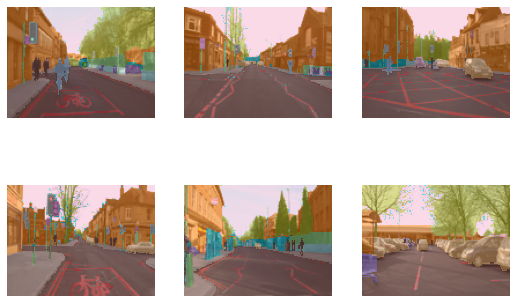

In [ ]:
dls.show_batch(max_n=6)

A traditional CNN won't work for segmentation, we have to use a special kind of model called a UNet, so we use unet_learner to define our Learner:

In [ ]:
learn = unet_learner(dls, resnet34)
learn.fine_tune(6)
# this will also take +/-5 minutes on CPU only

epoch,train_loss,valid_loss,time
0,2.746737,2.234393,00:33


epoch,train_loss,valid_loss,time
0,1.863232,1.640744,00:36
1,1.663314,1.446579,00:36
2,1.506723,1.261235,00:36
3,1.344316,1.117300,00:36
4,1.193130,1.005430,00:36
5,1.081825,0.998555,00:36


And as before, we can get some idea of the predicted results with show_results

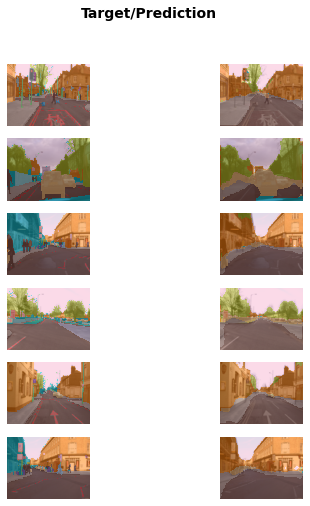

In [ ]:
learn.show_results(max_n=6, figsize=(7,8))

We can also sort the model's errors on the validation set using the SegmentationInterpretation class and then plot the instances with the k highest contributions to the validation loss.

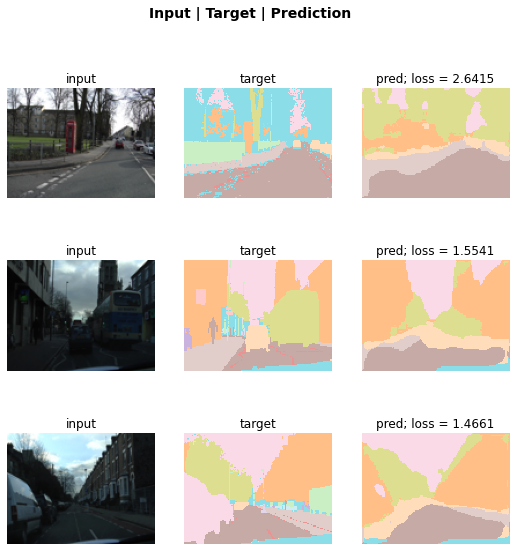

In [ ]:
interp = SegmentationInterpretation.from_learner(learn)
interp.plot_top_losses(k=3)

### Segmentation - With the data block API
We can also use the data block API to get our data in a DataLoaders. Like it's been said before, feel free to skip this part if you are not comfortable with learning new APIs just yet.

In this case we build the data block by providing:

* the types used: ImageBlock and MaskBlock. We provide the codes to MaskBlock as there is no way to guess them from the data.
* how to gather our items, here by using get_image_files.
* how to get the targets from our items: by using label_func.
* how to split the items, here randomly.
* batch_tfms for data augmentation.

Due to IPython and Windows limitation, python multiprocessing isn't available now.
So `number_workers` is changed to 0 to avoid getting stuck


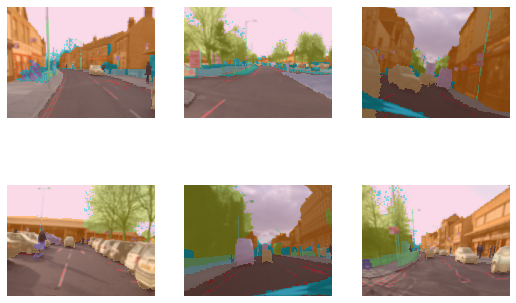

In [ ]:
camvid = DataBlock(blocks=(ImageBlock, MaskBlock(codes)),
                   get_items = get_image_files,
                   get_y = label_func,
                   splitter=RandomSplitter(),
                   batch_tfms=aug_transforms(size=(120,160)))
dls = camvid.dataloaders(path/"images", path=path, bs=8)
dls.show_batch(max_n=6)

## Points

This section uses the data block API, so if you skipped it before, we recommend you skip this section as well.

We will now look at a task where we want to predict points in a picture. For this, we will use the Biwi Kinect Head Pose Dataset. First thing first, let's begin by downloading the dataset as usual.

In [ ]:
path = untar_data(URLs.BIWI_HEAD_POSE)
# This will take +/- 10 minutes, depending on your connection speed

Let's see what we've got!

In [ ]:
path.ls()

(#50) [Path('C:/Users/u0131108/.fastai/data/biwi_head_pose/01'),Path('C:/Users/u0131108/.fastai/data/biwi_head_pose/01.obj'),Path('C:/Users/u0131108/.fastai/data/biwi_head_pose/02'),Path('C:/Users/u0131108/.fastai/data/biwi_head_pose/02.obj'),Path('C:/Users/u0131108/.fastai/data/biwi_head_pose/03'),Path('C:/Users/u0131108/.fastai/data/biwi_head_pose/03.obj'),Path('C:/Users/u0131108/.fastai/data/biwi_head_pose/04'),Path('C:/Users/u0131108/.fastai/data/biwi_head_pose/04.obj'),Path('C:/Users/u0131108/.fastai/data/biwi_head_pose/05'),Path('C:/Users/u0131108/.fastai/data/biwi_head_pose/05.obj')...]

There are 24 directories numbered from 01 to 24 (they correspond to the different persons photographed) and a corresponding .obj file (we won't need them here). We'll take a look inside one of these directories:

In [ ]:
(path/'01').ls()

(#1000) [Path('C:/Users/u0131108/.fastai/data/biwi_head_pose/01/depth.cal'),Path('C:/Users/u0131108/.fastai/data/biwi_head_pose/01/frame_00003_pose.txt'),Path('C:/Users/u0131108/.fastai/data/biwi_head_pose/01/frame_00003_rgb.jpg'),Path('C:/Users/u0131108/.fastai/data/biwi_head_pose/01/frame_00004_pose.txt'),Path('C:/Users/u0131108/.fastai/data/biwi_head_pose/01/frame_00004_rgb.jpg'),Path('C:/Users/u0131108/.fastai/data/biwi_head_pose/01/frame_00005_pose.txt'),Path('C:/Users/u0131108/.fastai/data/biwi_head_pose/01/frame_00005_rgb.jpg'),Path('C:/Users/u0131108/.fastai/data/biwi_head_pose/01/frame_00006_pose.txt'),Path('C:/Users/u0131108/.fastai/data/biwi_head_pose/01/frame_00006_rgb.jpg'),Path('C:/Users/u0131108/.fastai/data/biwi_head_pose/01/frame_00007_pose.txt')...]

Inside the subdirectories, we have different frames, each of them come with an image (\_rgb.jpg) and a pose file (\_pose.txt). We can easily get all the image files recursively with get_image_files, then write a function that converts an image filename to its associated pose file.

In [ ]:
img_files = get_image_files(path)
def img2pose(x): return Path(f'{str(x)[:-7]}pose.txt')
img2pose(img_files[0])

Path('C:/Users/u0131108/.fastai/data/biwi_head_pose/01/frame_00003_pose.txt')

We can have a look at our first image:

In [ ]:
im = PILImage.create(img_files[0])
im.shape

(480, 640)

(480, 640)

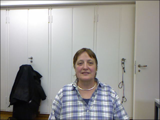

In [ ]:
im.to_thumb(160)

The Biwi dataset web site explains the format of the pose text file associated with each image, which shows the location of the center of the head. The details of this aren't important for our purposes, so we'll just show the function we use to extract the head center point:

In [ ]:
cal = np.genfromtxt(path/'01'/'rgb.cal', skip_footer=6)
def get_ctr(f):
    ctr = np.genfromtxt(img2pose(f), skip_header=3)
    c1 = ctr[0] * cal[0][0]/ctr[2] + cal[0][2]
    c2 = ctr[1] * cal[1][1]/ctr[2] + cal[1][2]
    return tensor([c1,c2])

This function returns the coordinates as a tensor of two items:

In [ ]:
get_ctr(img_files[0])
tensor([372.4046, 245.8602])

tensor([372.4046, 245.8602])

We can pass this function to DataBlock as get_y, since it is responsible for labeling each item. We'll resize the images to half their input size, just to speed up training a bit.

One important point to note is that we should not just use a random splitter. The reason for this is that the same person appears in multiple images in this dataset — but we want to ensure that our model can generalise to people that it hasn't seen yet. Each folder in the dataset contains the images for one person. Therefore, we can create a splitter function which returns true for just one person, resulting in a validation set containing just that person's images.

The only other difference to previous data block examples is that the second block is a PointBlock. This is necessary so that fastai knows that the labels represent coordinates; that way, it knows that when doing data augmentation, it should do the same augmentation to these coordinates as it does to the images.

Due to IPython and Windows limitation, python multiprocessing isn't available now.
So `number_workers` is changed to 0 to avoid getting stuck


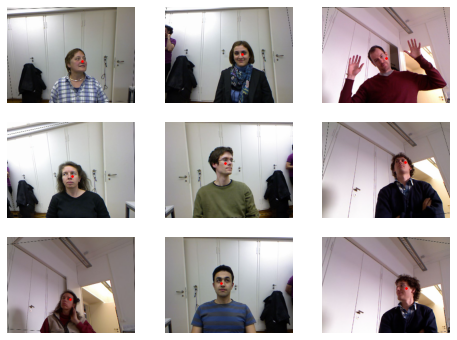

In [ ]:
biwi = DataBlock(
    blocks=(ImageBlock, PointBlock),
    get_items=get_image_files,
    get_y=get_ctr,
    splitter=FuncSplitter(lambda o: o.parent.name=='13'),
    batch_tfms=[*aug_transforms(size=(240,320)), 
                Normalize.from_stats(*imagenet_stats)]
)
dls = biwi.dataloaders(path)
dls.show_batch(max_n=9, figsize=(8,6))

Now that we have assembled our data, we can use the rest of the fastai API as usual. cnn_learner works perfectly in this case, and the library will infer the proper loss function from the data:

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to C:\Users\u0131108/.cache\torch\hub\checkpoints\resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

SuggestedLRs(valley=0.002511886414140463)

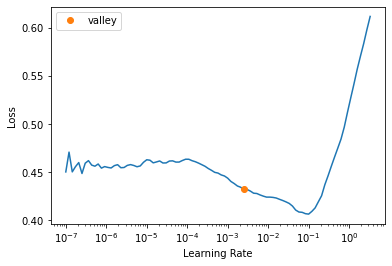

In [ ]:
learn = cnn_learner(dls, resnet18, y_range=(-1,1))
# this will take a few minutes (depending on speed of your connection)
learn.lr_find()
# this will also take +/- 60 minutes on CPU only

Then we can train our model:

In [ ]:
learn.fine_tune(1, 5e-3)
# this will also take +/- 90 minutes on CPU only

epoch,train_loss,valid_loss,time
0,0.057780,0.005750,44:07


epoch,train_loss,valid_loss,time
0,0.003323,0.000217,1:50:41


The loss is the mean squared error, so that means we make on average an error of

In [ ]:
math.sqrt(0.0001)

0.01

percent when predicting our points! And we can look at those results as usual:

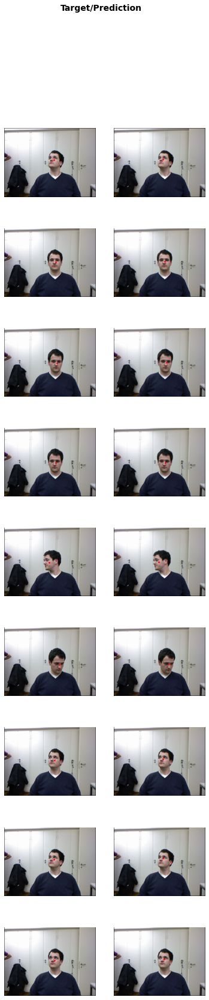

In [ ]:
learn.show_results()

## Exercises

1 - What two steps does the `fine_tune` method do?




2 - What are discriminative learning rates?




3 - What method does fastai provide to view the data in a `DataLoaders`? What is DataLoaders?
What four things do we need to tell fastai to create DataLoaders?





4 - What method does fastai provide to help you debug a `DataBlock`?




5 - Give two examples of ways that image transformations can degrade the quality of the data.


6 - What are the two pieces that are combined into cross-entropy loss in PyTorch?


7 - What are the two properties of activations that softmax ensures? Why is this important?


8 - Why can't we use `torch.where` to create a loss function for datasets where our label can have more than two categories?


9 - How is a Python `slice` object interpreted when passed as a learning rate to fastai?


10 - What will fastai do if you don't provide a validation set?


11 - Can we always use a random sample for a validation set? Why or why not?


12 - What is the "head" of a model?


13 - What is segmentation?


14 - Why is a GPU useful for deep learning? How is a CPU different, and why is it less effective for deep learning?

15 - What is the difference between `item_tfms` and `batch_tfms`?


16 - What is a confusion matrix?


17 - What does `export` save?

18 - How do we encode the dependent variable in a multi-label classification problem?

19 - Why can't we use regular accuracy in a multi-label problem?

20 - When is it okay to tune a hyperparameter on the validation set?